# Object spawning

In [5]:
from lxml import etree

function to create and empty world

In [103]:
def create_digital_tree_world(world_name='name'):
    # Create the root element with tag 'sdf' and attribute version='1.6'
    root = etree.Element("sdf", version='1.6')
    
    # Create the 'world' sub-element
    world = etree.SubElement(root, 'world', name=world_name)

    # List of XML fragments to be appended
    xml_strings = [
        """
        <light name='sun' type='directional'>
            <cast_shadows>1</cast_shadows>
            <pose frame=''>0 0 10 0 -0 0</pose>
            <diffuse>1 1 1 1</diffuse>
            <specular>0.2 0.2 0.2 1</specular>
            <attenuation>
                <range>1000</range>
                <constant>0.9</constant>
                <linear>0.01</linear>
                <quadratic>0.001</quadratic>
            </attenuation>
            <direction>-0.5 -0.5 -1</direction>
        </light>
        """,
        """
        <physics name='default_physics' default='0' type='ode'>
            <max_step_size>0.001</max_step_size>
            <real_time_factor>1</real_time_factor>
            <real_time_update_rate>1000</real_time_update_rate>
        </physics>
        """,
        """ 
        <scene>
            <ambient>1 1 1 1</ambient>
            <background>0.2 0.5 0.7 1</background>
            <shadows>0</shadows>
        </scene>
        """,
        f""" 
        <spherical_coordinates>
            <surface_model>EARTH_WGS84</surface_model>
            <latitude_deg>0.00</latitude_deg>
            <longitude_deg>0.00</longitude_deg>
            <elevation>0</elevation>
            <heading_deg>0</heading_deg>
        </spherical_coordinates>
        """,
        """ 
        <state world_name='default'>
            <sim_time>203 490000000</sim_time>
            <real_time>168 470627290</real_time>
            <wall_time>1596490486 155571625</wall_time>
            <iterations>167975</iterations>
            <light name='sun'>
                <pose frame=''>0 0 10 0 -0 0</pose>
                <light type="directional" name="light1">
                <pose>0 0 50 0 0 0</pose>
                <diffuse>0.5 0.5 0.5 1</diffuse>
                <specular>1 1 1 0</specular>
                <direction>1 0 0.5</direction>
            </light>

            <model name='digital_tree'>
                <pose frame=''>0 0 0 0 0 0</pose>
                <scale>1 1 1</scale>
                <link name='digital_tree_link'>
                <!-- TO MODIFY THE POSITION OF THE OBJ ON THE LOCAL MAP USE THIS POSE -->
                <pose frame=''> 0 0 0 0 0 0</pose>
                <velocity>0 0 0 0 0 0</velocity>
                <acceleration>0 0 0 0 0 0</acceleration>
                <wrench>0 0 0 0 -0 0</wrench>
                </link>
            </model>
        </state>
        """,
        """
        <gravity>0 0 -9.8</gravity>
        """,
        """
        <magnetic_field>6e-06 2.3e-05 -4.2e-05</magnetic_field>
        """,
        """
        <atmosphere type='adiabatic'/>
        """,
        """ 
        <model name='digital_tree'>
                <link name='digital_tree_link'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <inertial>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <mass>50</mass>
                    <inertia>
                        <ixx>1000</ixx>
                        <ixy>1000</ixy>
                        <ixz>1000</ixz>
                        <iyy>1000</iyy>
                        <iyz>1000</iyz>
                        <izz>1000</izz>
                    </inertia>
                    </inertial>
                    <collision name='digital_tree_link_collision'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <geometry>
                        <mesh>
                        <scale>1 1 1</scale>
                        <uri>model://digital_tree/meshes/digital_tree.dae</uri>
                        </mesh>
                    </geometry>
                    <max_contacts>10</max_contacts>
                    <surface>
                        <contact>
                        <ode/>
                        </contact>
                        <bounce/>
                        <friction>
                        <torsional>
                            <ode/>
                        </torsional>
                        <ode/>
                        </friction>
                    </surface>
                    </collision>
                    <visual name='digital_tree_link_visual'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <geometry>
                        <mesh>
                        <scale>1 1 1</scale>
                        <uri>model://digital_tree/meshes/digital_tree.dae</uri>
                        </mesh>
                    </geometry>
                    </visual>
                    <self_collide>0</self_collide>
                    <enable_wind>0</enable_wind>
                    <kinematic>0</kinematic>
                </link>
                <static>1</static>
                <pose frame=''>0 0 0 0 -0 0</pose>
            </model>
        """
    ]

    # Append each XML fragment to the 'world' element
    for xml_string in xml_strings:
        world.append(etree.fromstring(xml_string))

    return root

function to update the world `<state>` tag with the spawned object (apple, tennis ball)

In [118]:
def create_xml_state_model(objID, posX, posY, posZ, size=(1, 1, 1)):
  return f"""
          <model name='{objID}'>
            <pose frame=''>0 0 0 0 0 0</pose>
            <scale>{size[0]} {size[1]} {size[2]}</scale>
            <link name='{objID}_link'>
              <!-- TO MODIFY THE POSITION OF THE OBJ ON THE LOCAL MAP USE THIS POSE -->
              <pose frame=''> {posX} {posY} {posZ} 0 0 0</pose>
              <velocity>0 0 0 0 0 0</velocity>
              <acceleration>0 0 0 0 0 0</acceleration>
              <wrench>0 0 0 0 -0 0</wrench>
            </link>
          </model>"""

function to update the digital tree

In [141]:
def update_tree_model(objID, ObjTag, rgba=(0.51, 0.75, 0, 1)):

    # object find the key the use model item
    meshes_collection = {
    'TB' : '//tennis_ball/meshes/TennisBall.dae',
    'apple' : '//apple/meshes/apple.dae'
    }
    
    return f"""
            <model name='{objID}'>
                <link name='{objID}_link'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <inertial>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <mass>50</mass>
                    <inertia>
                        <ixx>1000</ixx>
                        <ixy>1000</ixy>
                        <ixz>1000</ixz>
                        <iyy>1000</iyy>
                        <iyz>1000</iyz>
                        <izz>1000</izz>
                    </inertia>
                    </inertial>
                    <collision name='{objID}_link_collision'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <geometry>
                        <mesh>
                        <scale>1 1 1</scale>
                        <uri>model:{meshes_collection[ObjTag]}</uri>
                        </mesh>
                    </geometry>
                    <max_contacts>10</max_contacts>
                    <surface>
                        <contact>
                        <ode/>
                        </contact>
                        <bounce/>
                        <friction>
                        <torsional>
                            <ode/>
                        </torsional>
                        <ode/>
                        </friction>
                    </surface>
                    </collision>
                    <visual name='{objID}_link_visual'>
                    <pose frame=''>0 0 0 0 -0 0</pose>
                    <geometry>
                        <mesh>
                        <scale>1 1 1</scale>
                        <uri>model:{meshes_collection[ObjTag]}</uri>
                        </mesh>
                    </geometry>
                    <material>
                        <ambient>{rgba[0]} {rgba[1]} {rgba[2]} {rgba[3]}</ambient>
                        <diffuse>0.7 0.9 0 1</diffuse>
                        <specular>0.2 0.2 0.2 64</specular>
                        <emissive>0.1 0 0.1 1</emissive>
                    </material>
                    </visual>
                    <self_collide>0</self_collide>
                    <enable_wind>0</enable_wind>
                    <kinematic>0</kinematic>
                </link>
                <static>1</static>
                <pose frame=''>0 0 0 0 -0 0</pose>
            </model>
            """

In [125]:
def apple_scale(Xsize, Ysize, Zsize):
    
    x_model = 0.060
    y_model = 0.060
    z_model = 0.060

    k_x = round(Xsize / x_model, 2)
    k_y = round(Ysize / y_model, 2)
    k_z = round(Zsize / z_model, 2)
    return (k_x, k_y, k_z)

In [126]:
apple_scale(0.058, 0.060, 0.064)

(0.97, 1.0, 1.07)

In [147]:
# object find the key the use model item
color_collection = {
'TB' : (0.51, 0.75, 0, 1),
'apple' : (0.9, 0.1, 0, 1)
}


# Create a new root element
root = create_digital_tree_world(world_name='positioning_tree' )


# Find the 'state' tag
state = root.find('.//state')
model = root.find('world')

# Iterate over the characters and their indices
for i, ObjName in enumerate(['1']):

    # get the object type, if it is an APPLE or TENNIS BALL instance
    ObjType = 'TB'

    # get the estimated position in meters
    PosX, PosY, PosZ = (-0.5, 0.057, 1.887)  # m

    # get the object size in meters
    SizeX, SizeY, SizeZ = (0.058, 0.060, 0.064)  # m

    # get scaling factors
    scale = apple_scale(SizeX, SizeY, SizeZ)

    # init the object in the digital twin
    new_state_model_string = create_xml_state_model(ObjName, PosX, PosY, PosZ, size=scale)    
    new_state_model_element = etree.fromstring(new_state_model_string)
   
    # Add the object model element to the root element
    state.append(new_state_model_element)

    # new model - updatecolor features
    model_str = update_tree_model(ObjName, ObjType, color_collection[ObjType])
    model_element = etree.fromstring(model_str)
    # print(model_str)

    model.append(model_element)  # add th eobject to the digital tree

# Create an ElementTree from the root element
tree = etree.ElementTree(root)

# Write the modified XML back to a file
with open('../worlds/digital_tree.world', 'wb') as f:
    tree.write(f, pretty_print=True, encoding='utf-8', xml_declaration=True)

# Feature extraction

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import cv2
import os

importing the round truthing data

In [2]:
GROUND_TRUTH_DF = pd.read_csv('../data/Organized_2024_GroundTruth.csv')
GROUND_TRUTH_DF = GROUND_TRUTH_DF.set_index('item')
GROUND_TRUTH_DF

,0_0_id,0_0_setup,0_0_d1,0_0_d2,0_0_position,0_0_x,0_0_level,0_0_y,0_0_ydef,0_0_z,...,2_2_position,2_2_x,2_2_level,2_2_y,2_2_ydef,2_2_z,2_2_zdef,2_2_camh1,2_2_camh2,2_2_camh3
item,,,,,,,,,,,,,,,,,,,,,
1,Tb,2d,65.60,65.60,L,-500.0,1.0,2000.0,1887.00,1516.0,...,L,-200.0,2.0,1700.0,1590.0,NaN,NaN,1100.0,1600.0,1850.0
2,Tb,2d,65.60,65.60,M,0.0,1.0,2000.0,1887.00,1516.0,...,M,0.0,2.0,1700.0,1590.0,NaN,NaN,1100.0,1600.0,1850.0
3,Tb,2d,65.60,65.60,R,500.0,1.0,2000.0,1887.00,1516.0,...,R,200.0,2.0,1700.0,1590.0,NaN,NaN,1100.0,1600.0,1850.0
4,Tb,2d,65.35,65.81,L,-500.0,2.0,1700.0,1587.00,1516.0,...,L,-200.0,3.0,1400.0,1290.0,NaN,NaN,1100.0,1600.0,1850.0
5,Tb,2d,65.35,65.81,M,0.0,2.0,1700.0,1587.00,1516.0,...,M,0.0,3.0,1400.0,1289.0,NaN,NaN,1100.0,1600.0,1850.0
6,Tb,2d,65.35,65.81,R,500.0,2.0,1700.0,1587.00,1516.0,...,R,200.0,3.0,1400.0,1288.0,NaN,NaN,1100.0,1600.0,1850.0
7,Tb,2d,65.41,65.60,L,-500.0,3.0,1400.0,1287.00,1516.0,...,L,-200.0,4.0,1100.0,986.0,NaN,NaN,1100.0,1600.0,1850.0
8,Tb,2d,65.41,65.60,M,0.0,3.0,1400.0,1287.00,1516.0,...,M,0.0,4.0,1100.0,992.0,NaN,NaN,1100.0,1600.0,1850.0
9,Tb,2d,65.41,65.60,R,500.0,3.0,1400.0,1287.00,1516.0,...,R,200.0,4.0,1100.0,989.0,NaN,NaN,1100.0,1600.0,1850.0


In [3]:
GROUND_TRUTH_ATTRIBUTES = GROUND_TRUTH_DF.columns  # get the data attributes
GROUND_TRUTH_ATTRIBUTES

Index(['0_0_id', '0_0_setup', '0_0_d1', '0_0_d2', '0_0_position', '0_0_x',
       '0_0_level', '0_0_y', '0_0_ydef', '0_0_z',
       ...
       '2_2_position', '2_2_x', '2_2_level', '2_2_y', '2_2_ydef', '2_2_z',
       '2_2_zdef', '2_2_camh1', '2_2_camh2', '2_2_camh3'],
      dtype='object', length=128)

In [4]:
IMG2D_PATH = '../data/xyz_positioning_and_sizing_error/2D'
IMG3D_PATH = '../data/xyz_positioning_and_sizing_error/3D'

In [21]:
# Set Pandas display options to show all columns and rows while printing
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

image is horizontal
trunk_cam_dist_mm= np.float64(1514.0) | pix_res_mm= np.float64(1.0800633931637553)

ObjType= 'Apple' - 1
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.892))



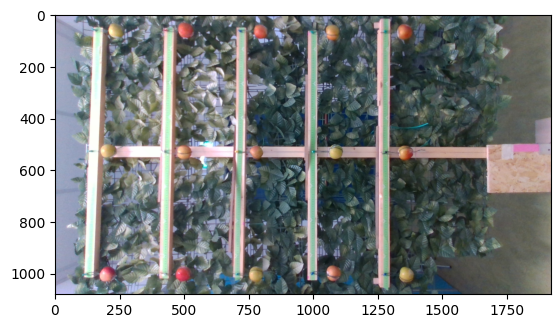

(532, 1870)
x=-329 | y= 867
**** -0.35534085635087553 0.026 1.0614149618729758


ObjType= 'Apple' - 2
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.892))



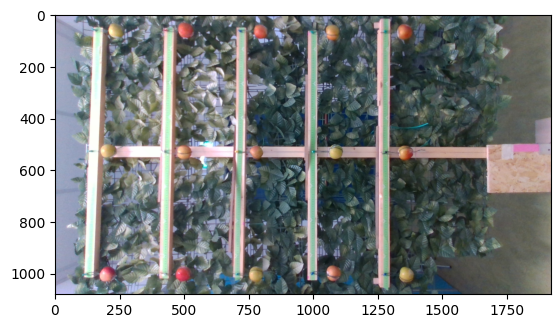

(532, 1870)
x=-327 | y= 1342
**** -0.353180729564548 0.0 1.5744450736257598


ObjType= 'Apple' - 3
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.892))



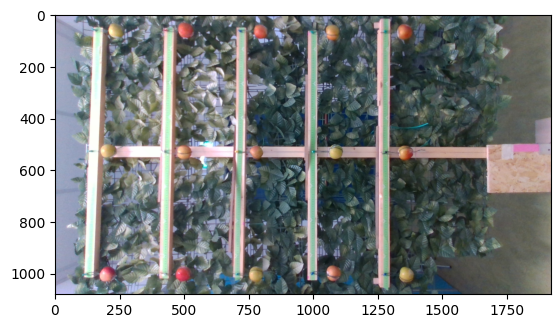

(532, 1870)
x=-297 | y= 1808
**** -0.3207788277696353 -0.007 2.0777546148400696


ObjType= 'Apple' - 4
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.592))



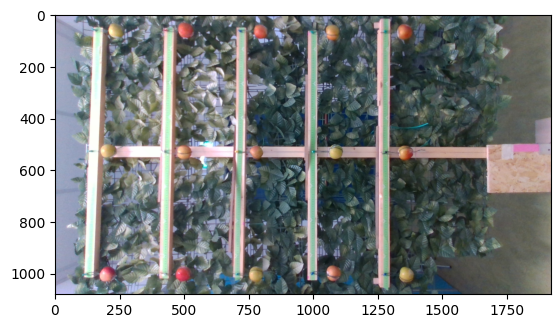

(532, 1870)
x=-37 | y= 869
**** -0.03996234554705894 0.023 1.0635750886593032


ObjType= 'Apple' - 5
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.593))



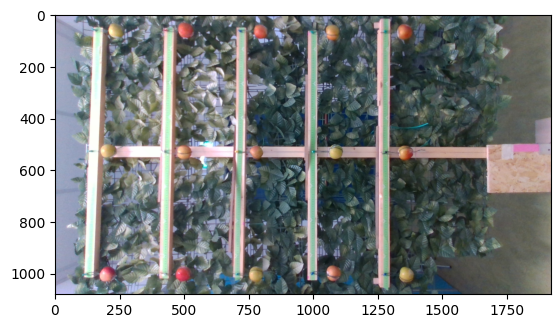

(532, 1870)
x=-34 | y= 1338
**** -0.03672215536756768 -0.056 1.5701248200531046


ObjType= 'Apple' - 6
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.591))



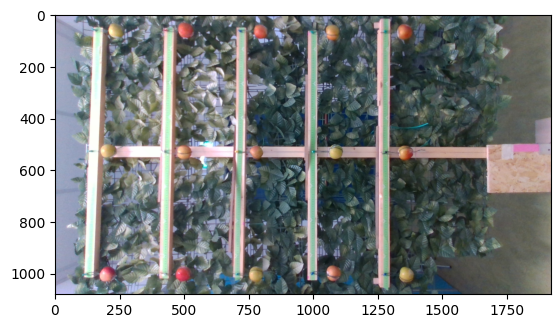

(532, 1870)
x=-27 | y= 1808
**** -0.02916171161542139 -1.19 2.0777546148400696


ObjType= 'Apple' - 7
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.292))



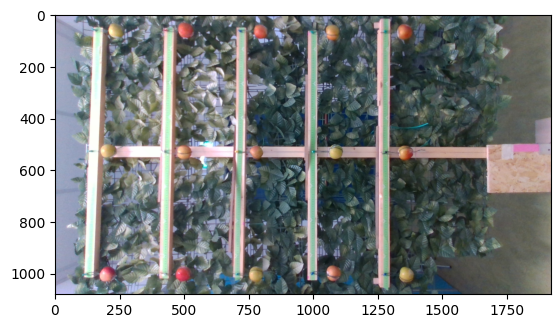

(532, 1870)
x=243 | y= 868
**** 0.26245540453879257 0.017 1.0624950252661396


ObjType= 'Apple' - 8
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.293))



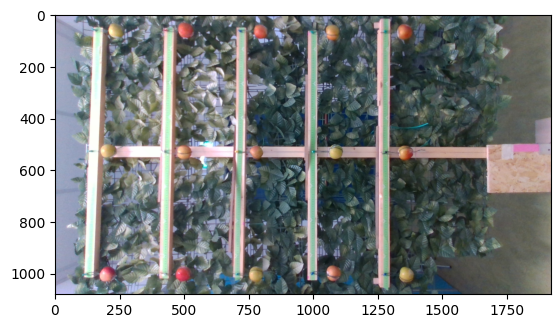

(532, 1870)
x=248 | y= 1338
**** 0.26785572150461134 -0.017 1.5701248200531046


ObjType= 'Apple' - 9
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.292))



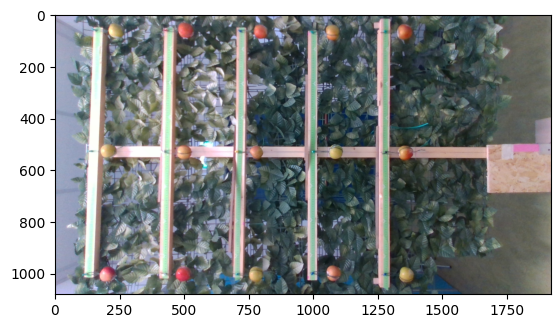

(532, 1870)
x=262 | y= 1803
**** 0.28297660900890387 -1.148 2.072354297874251


ObjType= 'Apple' - 10
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(0.992))



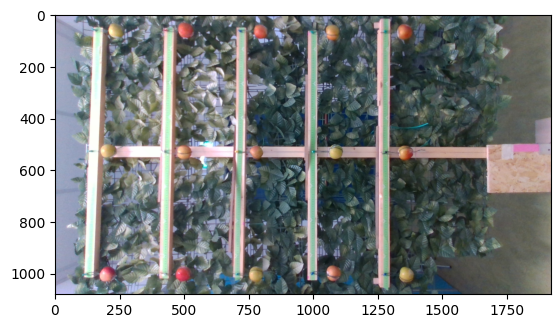

(532, 1870)
x=544 | y= 870
**** 0.5875544858810828 -0.028 1.0646551520524672


ObjType= 'Apple' - 11
ENU GTRUTH: (np.float64(0.0), 0, np.float64(0.992))



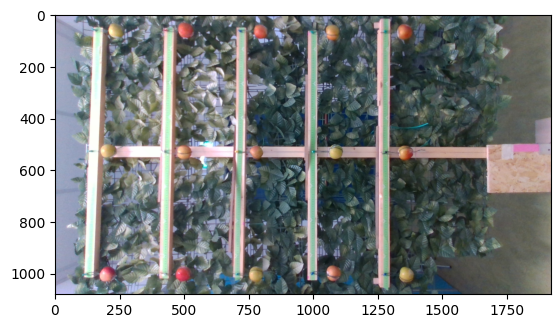

(532, 1870)
x=553 | y= 1338
**** 0.5972750564195567 0.039 1.5701248200531046


ObjType= 'Apple' - 12
ENU GTRUTH: (np.float64(0.5), 0, np.float64(0.992))



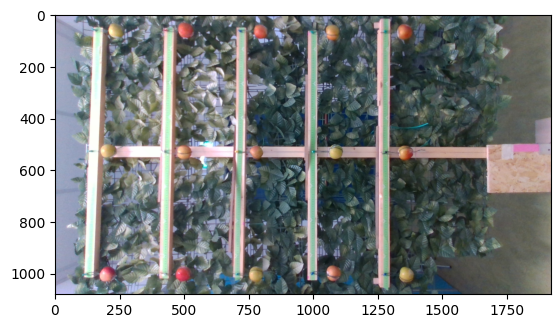

(532, 1870)
x=540 | y= 1799
**** 0.5832342323084279 0.042 2.0680340443015957


ObjType= 'Apple' - 13
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(0.692))



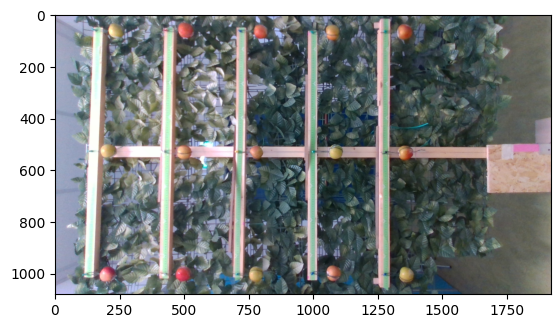

(532, 1870)
x=826 | y= 866
**** 0.8921323627532619 nan 1.0603348984798122


ObjType= 'Apple' - 14
ENU GTRUTH: (np.float64(0.0), 0, np.float64(0.691))



/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


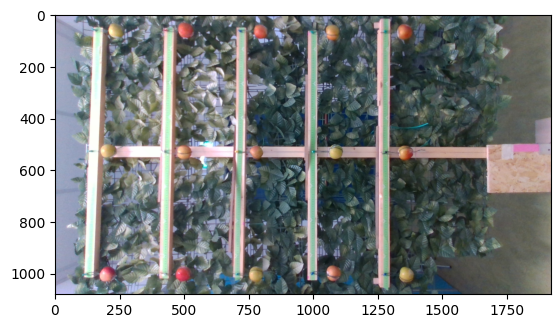

(532, 1870)
x=823 | y= 1335
**** 0.8888921725737706 nan 1.5668846298736134


ObjType= 'Apple' - 15
ENU GTRUTH: (np.float64(0.5), 0, np.float64(0.691))



/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


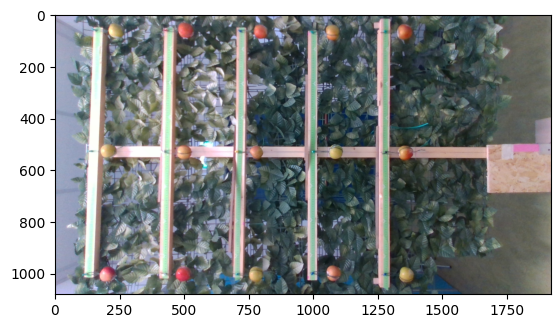

(532, 1870)
x=819 | y= 1802
**** 0.8845719190011155 nan 2.0712742344810873


ObjType= 'Trunk' - 
image is horizontal
trunk_cam_dist_mm= np.float64(1535.0) | pix_res_mm= np.float64(1.0950444574018257)

ObjType= 'Apple' - 1
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.892))



/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


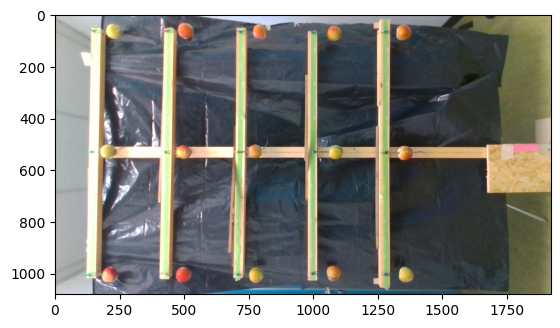

(532, 1869)
x=-319 | y= 863
**** -0.3493191819111824 0.054 1.0700233667377756


ObjType= 'Apple' - 2
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.892))



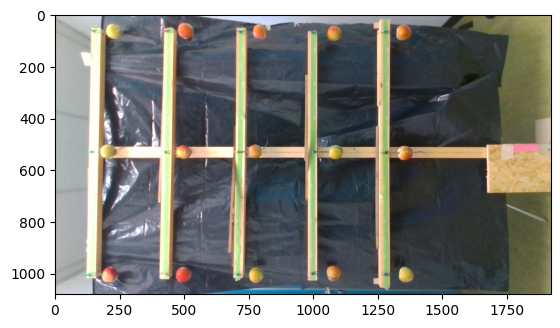

(532, 1869)
x=-324 | y= 1338
**** -0.3547944041981915 0.021 1.5901694840036427


ObjType= 'Apple' - 3
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.892))



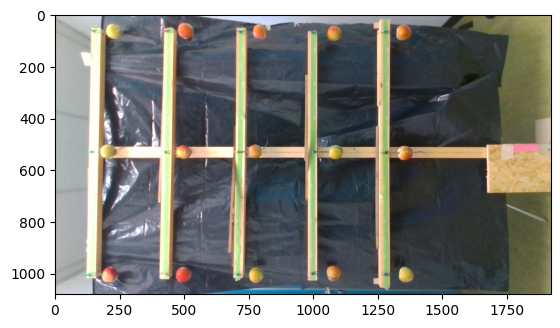

(532, 1869)
x=-305 | y= 1802
**** -0.33398855950755685 -1.201 2.0982701122380893


ObjType= 'Apple' - 4
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.592))



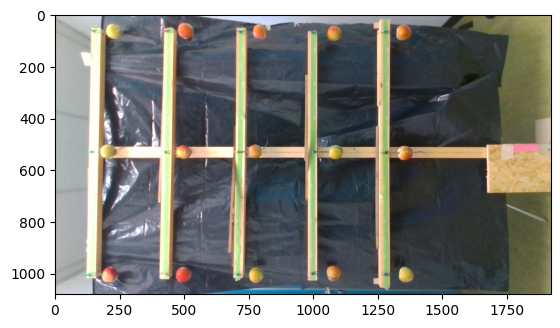

(532, 1869)
x=-35 | y= 864
**** -0.0383265560090639 0.034 1.0711184111951775


ObjType= 'Apple' - 5
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.593))



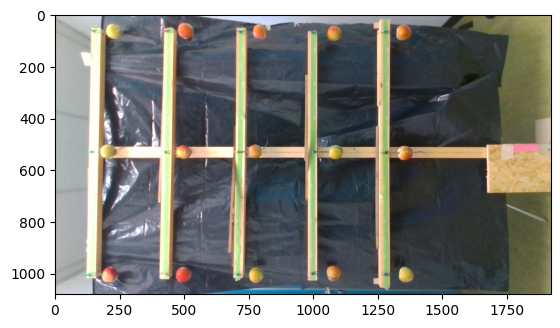

(532, 1869)
x=-34 | y= 1339
**** -0.03723151155166207 -0.039 1.5912645284610447


ObjType= 'Apple' - 6
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.591))



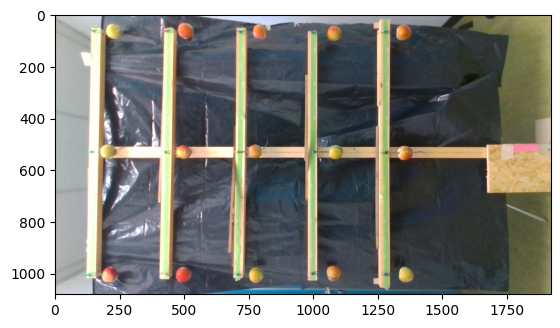

(532, 1869)
x=-27 | y= 1806
**** -0.029566200349849293 -1.304 2.102650290067697


ObjType= 'Apple' - 7
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(1.292))



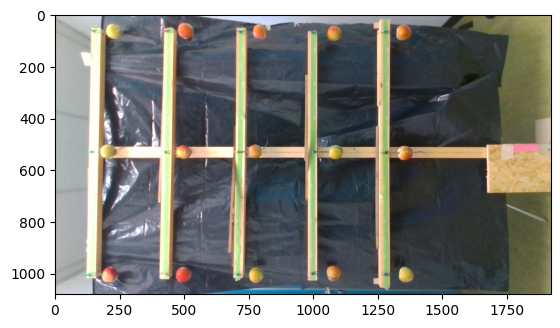

(532, 1869)
x=245 | y= 863
**** 0.26828589206344733 0.034 1.0700233667377756


ObjType= 'Apple' - 8
ENU GTRUTH: (np.float64(0.0), 0, np.float64(1.293))



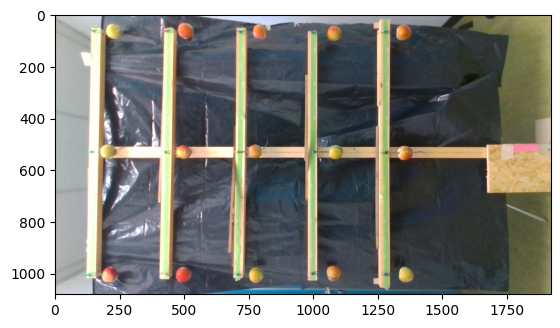

(532, 1869)
x=242 | y= 1340
**** 0.2650007586912418 0.021 1.5923595729184465


ObjType= 'Apple' - 9
ENU GTRUTH: (np.float64(0.5), 0, np.float64(1.292))



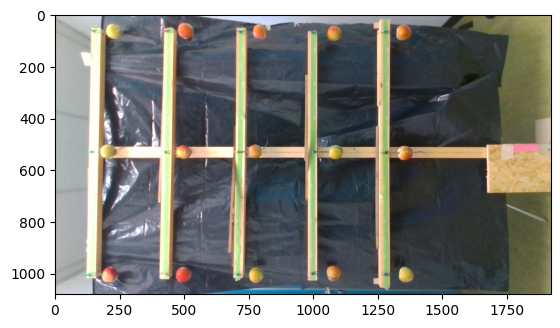

(532, 1869)
x=259 | y= 1800
**** 0.2836165144670728 -1.257 2.096080023323286


ObjType= 'Apple' - 10
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(0.992))



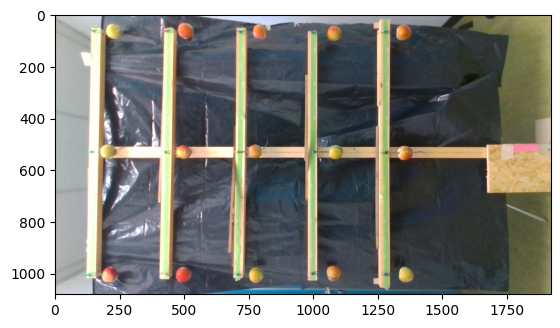

(532, 1869)
x=545 | y= 869
**** 0.596799229283995 -1.056 1.0765936334821866


ObjType= 'Apple' - 11
ENU GTRUTH: (np.float64(0.0), 0, np.float64(0.992))



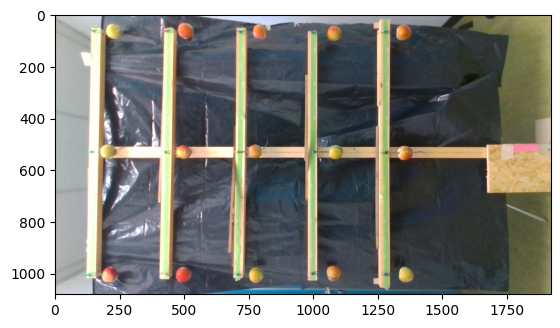

(532, 1869)
x=554 | y= 1336
**** 0.6066546294006114 -0.003 1.587979395088839


ObjType= 'Apple' - 12
ENU GTRUTH: (np.float64(0.5), 0, np.float64(0.992))



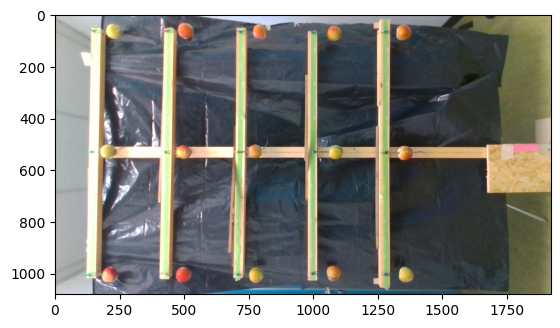

(532, 1869)
x=548 | y= 1796
**** 0.6000843626562005 -1.169 2.091699845493679


ObjType= 'Apple' - 13
ENU GTRUTH: (np.float64(-0.5), 0, np.float64(0.692))



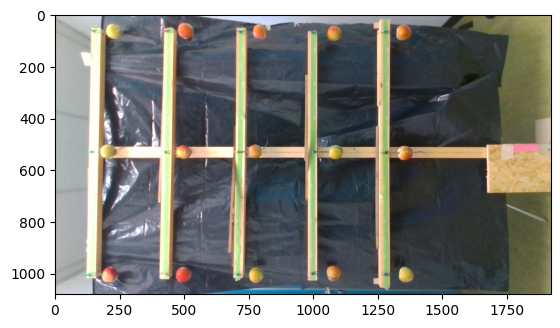

(532, 1869)
x=825 | y= 864
**** 0.9034116773565062 nan 1.0711184111951775


ObjType= 'Apple' - 14
ENU GTRUTH: (np.float64(0.0), 0, np.float64(0.691))



/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


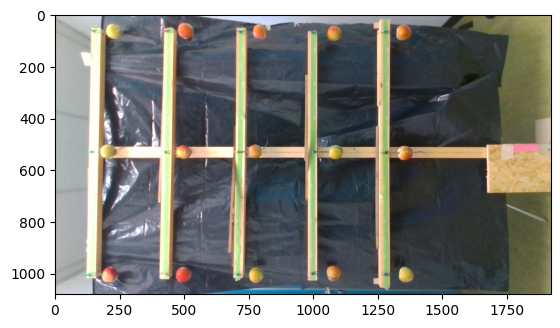

(532, 1869)
x=821 | y= 1334
**** 0.8990314995268989 nan 1.5857893061740354


ObjType= 'Apple' - 15
ENU GTRUTH: (np.float64(0.5), 0, np.float64(0.691))



/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


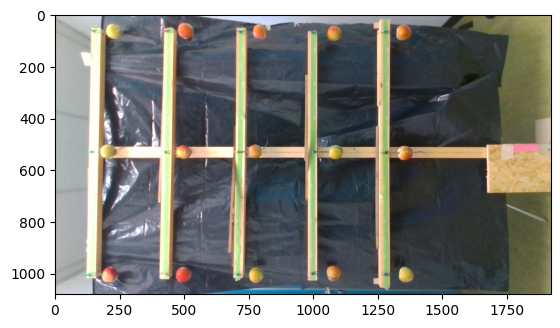

(532, 1869)
x=816 | y= 1798
**** 0.8935562772398897 nan 2.0938899344084825


ObjType= 'Trunk' - 


/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/media/mirko/Volume/GITHUB/Positioning_IEEE2024/env/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [86]:
DELTA_TRUNK_POSITION_FROM_SOIL = 125  #mm
for fn in [fn for fn in os.listdir(IMG2D_PATH) if fn.find('img') != -1 and fn.endswith('png')][0:2]:

        image_orientation = None

        # get col mat
        col_file = fn

        # get depth mat
        depth_file = fn.replace('img', 'depth')

        # get json annnot
        json_file = fn.replace('.png', '.json')

        # get txt annot
        txt_file = fn.replace('.png', '.txt')

        # from the image name get the trial and repetition code -- this is needed to access the ground truth data
        color_fn_split = str(col_file).split('_')

        trial_code = f'{color_fn_split[1]}_{color_fn_split[2]}'

        # create the image file path
        col_file = os.path.join(IMG2D_PATH, col_file)
        if not os.path.isfile(col_file):
                col_file = os.path.join(IMG3D_PATH, col_file)


        # open the color mat
        im_rgb = cv2.imread(col_file)[:,:,::-1]

        if im_rgb.shape[0] < im_rgb.shape[1]:
                print('image is horizontal')
                image_orientation = 'H'
                HFOV = 69
                VFOV = 42
                W = im_rgb.shape[1]
                H = im_rgb.shape[0]
        else:
                image_orientation = 'V'
                pass


        depth_file = os.path.join(IMG2D_PATH, depth_file)
        if not os.path.isfile(depth_file):
                depth_file = os.path.join(IMG3D_PATH, col_file)

        # open the depth mat
        im_depth = cv2.imread(depth_file, cv2.IMREAD_ANYDEPTH)  

        # create the annotation path  -- to distinguish object and trunk
        ann_file_txt = os.path.join(IMG2D_PATH, txt_file)
        if not os.path.isfile(ann_file_txt):
                ann_file_txt = os.path.join(IMG3D_PATH, txt_file)
        
        # open the txt file
        txt_annot = pd.read_csv(ann_file_txt, names=['cls', 'x', 'y', 'w', 'h'])
        
        # create the annotation path  -- to get the object position n the tree (description tag)
        ann_file_json = os.path.join(IMG2D_PATH, json_file)
        if not os.path.isfile(ann_file_json):
                ann_file_json = os.path.join(IMG3D_PATH, json_file)

        # open the json_file
        with open(ann_file_json, 'r') as json_file:
                json_annot = json.load(json_file)

        # search fro trunk
        trunk_pos = None
        trunk_data = {'origin' : None, 'tl' : [], 'br' : []}
        while trunk_pos == None:
                for Obj in json_annot['objects']:

                        # object type
                        ObjType = Obj['classTitle']
                        # print(ObjType)

                        if ObjType == 'Trunk':
                                # object absolute coordinates
                                Trunk_absCoords_list = Obj['points']['exterior']
                                # split into TL and BR
                                trunk_tl, trunk_br = Trunk_absCoords_list


                                trunk_data['tl'] = trunk_tl
                                trunk_data['br'] = trunk_br

                                if image_orientation == 'H':
                                       trunk_data['origin'] = trunk_br
                                # else:
                                #        trunk_data['origin'] = (int(trunk_tl[1]), trunk_br[1])

                                trunk_pos = True
                                break
        
        # get the trunk-camera distance
        trunk_cam_dist_mm = np.nanmedian(im_depth[trunk_data['tl'][1] : trunk_data['br'][1],
                                     trunk_data['tl'][0] : trunk_data['br'][0]])
        
        pix_res_mm = np.sqrt((4 * trunk_cam_dist_mm**2 * np.tan(np.deg2rad(VFOV)/2) * np.tan(np.deg2rad(HFOV) / 2))/ (H * W))  # mm/pix

        print(f'{trunk_cam_dist_mm= } | {pix_res_mm= }')

        

        for ind,  Obj in enumerate(json_annot['objects']):


                # obj position
                ObjPosition = Obj['description']

                # object type
                ObjType = Obj['classTitle']
                # print(ObjType)

                print(f'\n{ObjType= } - {ObjPosition}')

                # object absolute coordinates
                Obj_absCoords_list = Obj['points']['exterior']
                # split into TL and BR
                tl, br = Obj_absCoords_list


                # search FOR THE TRUNK
                trunk_obj =  len(json_annot['objects'])

                if ObjType != 'Trunk':
                        # get gtruth data as series
                        bbox_gtruth = GROUND_TRUTH_DF.loc[int(ObjPosition), :]
                        attributes = [attr for attr in bbox_gtruth.index if attr.find(trial_code) != -1]

                        bbox_gtruth = bbox_gtruth.loc[attributes].copy()

                        # print(bbox_gtruth)


                        PosX_gtruth = bbox_gtruth.loc[f'{trial_code}_x'] / 1000  # proper x [m]
                        PosY_gtruth = bbox_gtruth.loc[f'{trial_code}_ydef'] / 1000 # height [m]
                        # PosZ_gtruth = bbox_gtruth.loc[f'{trial_code}_zdef']  # obj - camera distance [mm]

                        # proper Z coord in Obj - Trunk distance
                        # PosZ_gtruth = (PosZ_gtruth - trunk_cam_dist_mm) / 1000 # [m]


                        PosZ_gtruth = 0


                        # print(PosZ_gtruth)

                        PosENU_gtruth = (PosX_gtruth, PosZ_gtruth, PosY_gtruth)
                        print(f'ENU GTRUTH: {PosENU_gtruth}')
                        print()

                        plt.imshow(im_rgb)
                        plt.show()

                        # estimate the position
                        if image_orientation == 'H' and ind < 1
:
                               

                                trunk_y =  trunk_data['origin'][0]  # nel mondo è la Y
                                trunk_x =  trunk_data['origin'][1]  # nel mondo è la X


                                print(f'{trunk_x, trunk_y}')


                                # the trunk is in the right side of the image
                                xc =  int(tl[0] + (br[0] - tl[0])/ 2)  # nel mondo è la X
                                yc =  int(tl[1] + (br[1] - tl[1])/ 2)  # nel mondo è la Y


                                im_rgb[tl[0] : br[0],
                                       tl[1] : br[1]] = (255, 255, 255)

                                w = int((br[1] - tl[1])/ 2)
                                h = int((br[0] - tl[0])/ 2)

                                x = xc - trunk_x  # pixels
                                y = trunk_y - yc  # pixels

                                print(f'{x=} | {y= }')

                               
                                # get obj-camera distance at the center of the bbox
                                obj_cam_dist = np.nanmedian(im_depth[tl[0] + h //2 : br[0] - h //2, 
                                                                     tl[1] + w //2 : br[1] - w//2])  # mm
                                
                                z = (trunk_cam_dist_mm - obj_cam_dist) / 1000  # m

                                # get pixel resolution in mm
                                # pix_res_mm = np.sqrt((4 * obj_cam_dist**2 * np.tan(np.deg2rad(VFOV)/2) * np.tan(np.deg2rad(HFOV) / 2))/ (H * W))  # mm/pix


                                # position estimation
                                PosX = (x * pix_res_mm) / 1000 # m

                                PosY = ((y * pix_res_mm) + DELTA_TRUNK_POSITION_FROM_SOIL) / 1000 # m

                                PosZ = z   # m

                                print('****', PosX, PosZ, PosY)


                                                        
                        else:
                                pass
                                # HFOV = 42
                                # VFOV = 69
                                # W = im_rgb.shape[1]
                                # H = im_rgb.shape[0]

                                # x = int(tl[1] + (br[1] - tl[1])/ 2) - trunk_data['origin'][0]
                                # y = int(tl[0] + (br[0] - tl[0])/ 2) - trunk_data['origin'][1]

                                # w = int((br[1] - tl[1])/ 2)
                                # h = int((br[0] - tl[0])/ 2)
                                
                                # # get obj-camera distance at the center of the bbox
                                # obj_cam_dist = np.nanmedian(im_depth[tl[0] + h //2 : br[1] - h //2, tl[1] + w //2 : br[1] - w//2])  # mm
                                # z = (obj_cam_dist - trunk_cam_dist_mm) / 1000  # m

                                # # position estimation
                                # PosX = (x * pix_res_mm) / 1000 # m
                                # POsY = (y * pix_res_mm) / 1000 # m
                                # PosZ = z  # m



                                # print(PosX, PosZ, PosY)
                        print()
                               



        #                 # removing the trial_code from the attribute name to keep it clear    
        #                 for info in attributes:
        #                 *_, information = info.split('_')
        #                 print(information)


